# Data analysis

#### Nhập thư viện

In [1]:
import pandas as pd
import numpy as np
import datetime
import re
import calmap
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

#### Đọc dữ liệu từ file csv

In [2]:
df = pd.read_csv('Data/sieuanhhungMarvel.csv')

In [3]:
df.head()

,post_id,text,time,images_low,like,love,haha,sad,wow,care,angry,reaction_count,shares,comment,year,month,day,images_count,max_reaction_count_comment,all_comment_texts
0,734518898719448,Các bạn nam chắc ai cũng muốn học chiêu pause ...,2023-11-18 22:40:26,['https://scontent.fhan14-3.fna.fbcdn.net/v/t3...,1983,18,801,8,1,6,0,2817,21,101,2023,11,18,2,48,"[""'tôi có ý này...'"", ""'Viet Hung ông yên tâm ..."
1,734285772076094,Nếu như Pedro một mình cân tất cả các vai ở Fa...,2023-11-18 12:51:48,['https://scontent.fhan14-2.fna.fbcdn.net/v/t3...,2014,19,1667,21,4,7,1,3733,13,94,2023,11,18,1,2,"[""'Vẫn thích John Krasinski cơ'"", ""'Nhìn susan..."
2,734234215414583,Sau bom tấn Spider-Man 2 thì dự án tiếp theo c...,2023-11-18 10:21:01,['https://scontent.fhan14-2.fna.fbcdn.net/v/t3...,1543,45,275,5,8,5,1,1882,9,51,2023,11,18,1,0,"[""'Tùng'"", ""'Nguyễn Mạnh Cường mua PS5 đi =(('""]"
3,734194055418599,Infinity Magic 🔥,2023-11-18 08:30:34,['https://scontent.fhan14-1.fna.fbcdn.net/v/t3...,3997,638,18,4,14,26,1,4698,34,60,2023,11,18,1,0,"[""'Đỗ Thị Hồng Hạnh'"", ""'Màu phép giống mấy vi..."
4,733990162105655,Nam diễn viên Steven Yeun được xác nhận từ nhi...,2023-11-17 23:17:50,['https://scontent.fhan14-3.fna.fbcdn.net/v/t3...,732,56,171,1,2,3,1,966,5,56,2023,11,17,1,0,"[""'sentry :))'"", ""'Trần Duy'""]"


### Thống kê cơ bản

#### Tổng số bài đăng từ 19/09/2023 - 18/11/2023

In [4]:
total_post = len(df['post_id'].unique())
total_post

216

#### Trung bình reaction_count của các tháng

In [5]:
filtered_data = df[df['month'].isin([9, 10, 11])]

average_reaction_count_by_month = filtered_data.groupby('month')['reaction_count'].mean()

print("Trung bình reaction_count trong tháng 9:", average_reaction_count_by_month[9].round(1))
print("Trung bình reaction_count trong tháng 10:", average_reaction_count_by_month[10].round(1))
print("Trung bình reaction_count trong tháng 11:", average_reaction_count_by_month[11].round(1))

Trung bình reaction_count trong tháng 9: 4434.5
Trung bình reaction_count trong tháng 10: 2805.2
Trung bình reaction_count trong tháng 11: 4444.4


#### Tổng số like từ 19/09/2023 - 18/11/2023

In [6]:
total_like = df['like'].sum()
total_like

535141

#### Tổng số love từ 19/09/2023 - 18/11/2023

In [7]:
total_love = df['love'].sum()
total_love

48141

#### Tổng số haha từ 19/09/2023 - 18/11/2023

In [8]:
total_haha = df['haha'].sum()
total_haha

188757

#### Tổng số sad từ 19/09/2023 - 18/11/2023

In [9]:
total_sad = df['sad'].sum()
total_sad

13618

#### Tổng số care từ 19/09/2023 - 18/11/2023

In [10]:
total_care = df['care'].sum()
total_care

2536

#### Tổng số angry từ 19/09/2023 - 18/11/2023

In [11]:
total_angry = df['angry'].sum()
total_angry

284

#### Tổng số reaction từ 19/09/2023 - 18/11/2023

In [12]:
total_reaction = df['reaction_count'].sum()
total_reaction

790864

#### Tổng số comment từ 19/09/2023 - 18/11/2023

In [13]:
total_comment = df['comment'].sum()
total_comment

31458

#### Tổng số share từ 19/09/2023 - 18/11/2023

In [14]:
total_share = df['shares'].sum()
total_share

7783

#### Ngày đăng nhiều post nhất

In [15]:
df['time'] = pd.to_datetime(df['time'])
df['date'] = df['time'].dt.date

post_count_by_date = df.groupby('date')['post_id'].count().reset_index(name='post_count')
max_post_date = post_count_by_date.loc[post_count_by_date['post_count'].idxmax()]

print("Ngày có nhiều post nhất là:", max_post_date['date'])
print("Số lượng post:", max_post_date['post_count'])

Ngày có nhiều post nhất là: 2023-10-23
Số lượng post: 7


#### Ngày đăng ít post nhất (tính từ 19/9 - 18/11)

In [16]:
def find_missing_date(df):
    start_date = pd.to_datetime('19/9/2023', format='%d/%m/%Y')
    end_date = pd.to_datetime('20/11/2023', format='%d/%m/%Y')

    all_dates = pd.date_range(start_date, end_date, freq='D')
    all_dates_df = pd.DataFrame({'date': all_dates})

    all_dates_df['date'] = pd.to_datetime(all_dates_df['date'])

    missing_dates = all_dates_df[~all_dates_df['date'].isin(df['date'])]['date']

    return missing_dates

In [17]:
if len(find_missing_date(df)) > 0:
    temp = find_missing_date(df)
    for i in range(len(temp)):
        print("Ngày có ít post nhất: ", temp.iloc[i])
        print("Số lượng post: 0")
else:
    post_count_by_date = df.groupby('date')['post_id'].count().reset_index(name='post_count')

    min_post_date = post_count_by_date.loc[post_count_by_date['post_count'].idxmin()]

    print("Ngày có ít post nhất:", min_post_date['date'])
    print("Số lượng post:", min_post_date['post_count'])

Ngày có ít post nhất:  2023-11-19 00:00:00
Số lượng post: 0
Ngày có ít post nhất:  2023-11-20 00:00:00
Số lượng post: 0


#### Bài viết có nhiều lượt thả haha nhất

In [18]:
max_haha_post = df.loc[df.haha.idxmax()]

print("Post id: ", max_haha_post['post_id'])
print("Haha: ", max_haha_post['haha'])
print('Date: ', max_haha_post.date)

Post id:  726632232841448
Haha:  14682
Date:  2023-11-04


#### Bài viết ít haha nhất

In [19]:
min_haha_post = df.loc[df.haha.idxmin()]

print("Post id: ", min_haha_post['post_id'])
print("Haha: ", min_haha_post['haha'])
print('Date: ', min_haha_post.date)

Post id:  724257629745575
Haha:  0
Date:  2023-10-31


#### Ngày có nhiều lượt reaction xúc nhất

In [20]:
max_reaction_count = df.loc[df.reaction_count.idxmax()]

print("Post id: ", max_reaction_count.post_id)
print("Reaction_count: ", max_reaction_count.reaction_count)
print('Date: ', max_reaction_count.date)

Post id:  726632232841448
Reaction_count:  25249
Date:  2023-11-04


#### Bài viết có ít lượt thả reaction nhất

In [21]:
min_reaction_count = df.loc[df.reaction_count.idxmin()]

print("Post id: ", min_reaction_count.post_id)
print("Reaction_count: ", min_reaction_count.reaction_count)
print('Date: ', min_reaction_count.date)

Post id:  727818706056134
Reaction_count:  132
Date:  2023-11-06


#### Bài viết có nhiều lượt love nhất

In [22]:
max_love = df.loc[df.love.idxmax()]

print("Post id: ", max_love.post_id)
print("Sad: ", max_love.love)
print('Date: ', max_love.date)

Post id:  701511478686857
Sad:  4504
Date:  2023-09-24


#### Bài viết có nhiều lượt thả sad nhất

In [23]:
max_sad = df.loc[df.sad.idxmax()]

print("Post id: ", max_sad.post_id)
print("Sad: ", max_sad.sad)
print('Date: ', max_sad.date)

Post id:  699139842257354
Sad:  2047
Date:  2023-09-20


#### Trung bình lượt shares

In [24]:
shares_mean = df['shares'].mean()
shares_mean.round(1)

36.0

#### Bài viết có nhiều lượt share nhất

In [25]:
max_shares = df.loc[df.shares.idxmax()]

print("Post id: ", max_shares.post_id)
print("Shares: ", max_shares.shares)
print("Date: ", max_shares.date)

Post id:  726632232841448
Shares:  600
Date:  2023-11-04


#### Bài viết ít lượt share nhất

In [26]:
min_shares = df.loc[df.shares.idxmin()]

print("Post id: ", min_shares.post_id)
print("Shares: ", min_shares.shares)
print("Date: ", min_shares.date)

Post id:  701329305371741
Shares:  0
Date:  2023-09-24


#### Bài viết có nhiều comment nhất

In [27]:
max_comment = df.loc[df.comment.idxmax()]

print("Post id: ", max_comment.post_id)
print("Comment: ", max_comment.shares)
print("Date: ", max_comment.date)

Post id:  714998230671515
Comment:  235
Date:  2023-10-16


#### Bài viết có ít comment nhất

In [28]:
min_comment = df.loc[df.comment.idxmin()]

print("Post id: ", min_comment.post_id)
print("Comment: ", min_comment.shares)
print("Date: ", min_comment.date)

Post id:  724257629745575
Comment:  8
Date:  2023-10-31


#### Bài viết có comment có nhiều lượt thả cảm xúc nhất

In [29]:
df.columns

Index(['post_id', 'text', 'time', 'images_low', 'like', 'love', 'haha', 'sad',
       'wow', 'care', 'angry', 'reaction_count', 'shares', 'comment', 'year',
       'month', 'day', 'images_count', 'max_reaction_count_comment',
       'all_comment_texts', 'date'],
      dtype='object')

In [30]:
max_comment_reaction = df.loc[df.max_reaction_count_comment.idxmax()]

print("Post id: ", max_comment_reaction.post_id)
print("Reaction: ", max_comment_reaction.max_reaction_count_comment)
print("Date: ", max_comment_reaction.date)

Post id:  701511478686857
Reaction:  323
Date:  2023-09-24


#### Từ khóa được nhắc đến nhiều nhất trong comment

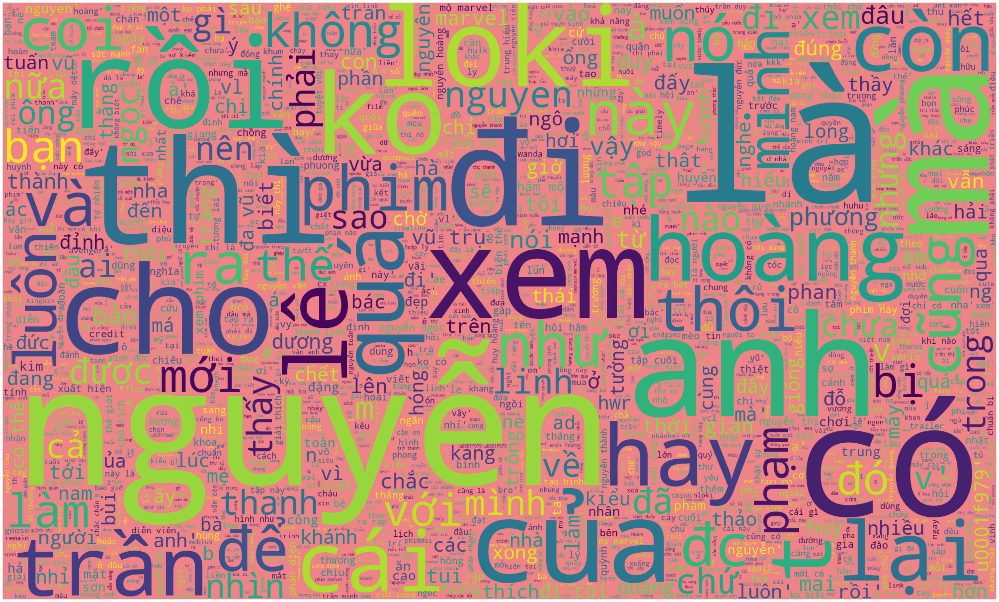

In [31]:
text = ""
for i in range(len(df)):
    for j in range(len(df.loc[i, 'all_comment_texts'])):
        text += df.loc[i, 'all_comment_texts'][j]
text = text.lower()

from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(stopwords=STOPWORDS,
                          background_color='#eb8387', 
                      max_words=2000,
                      width=2000, height=1200
                         ).generate(text)
plt.figure(figsize=(50,30))
plt.clf()
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

### Content 

#### Nhân vật marvel được nhắc đến nhiều nhất trong nội dung bài viết(19/9 - 18/11)

In [32]:
avengers_characters = ["Iron Man","Captain America","Thor","Hulk","Black Widow","Hawkeye","Black Panther","Doctor Strange","Scarlet Witch","Vision","Ant-Man","Wasp","Falcon","Winter Soldier","Star-Lord","Gamora","Drax the Destroyer","Rocket","Groot","Mantis","Nebula","Captain Marvel","Spider-Man","Loki","Nick Fury","Maria Hill"]

character_counts = pd.Series(index=avengers_characters, dtype=int)

for character in avengers_characters:
    character_counts[character] = df['text'].str.count(character).sum()

print(character_counts)
print("Max:", character_counts.idxmax(), ":", int(character_counts[character_counts.idxmax()]))

Iron Man               0.0
Captain America        5.0
Thor                   6.0
Hulk                   1.0
Black Widow            4.0
Hawkeye                1.0
Black Panther          2.0
Doctor Strange         3.0
Scarlet Witch          0.0
Vision                 3.0
Ant-Man                1.0
Wasp                   1.0
Falcon                 1.0
Winter Soldier         0.0
Star-Lord              1.0
Gamora                 0.0
Drax the Destroyer     0.0
Rocket                 0.0
Groot                  0.0
Mantis                 0.0
Nebula                 0.0
Captain Marvel         7.0
Spider-Man            11.0
Loki                  74.0
Nick Fury              0.0
Maria Hill             0.0
dtype: float64
Max: Loki : 74


#### Những từ khóa được nhắc đến nhiều trong nội dung của bài post (5/11/2023 - 12/11/2023)

In [33]:
df['time'] = pd.to_datetime(df['time'])

start_date = pd.Timestamp('2023-11-05')
end_date = pd.Timestamp('2023-11-12')

filtered_df = df[(df['time'] >= start_date) & (df['time'] <= end_date)]

text = ""
for i in range(len(filtered_df)):
    text = text + str(filtered_df['text'].iloc[i])

text = text.lower()

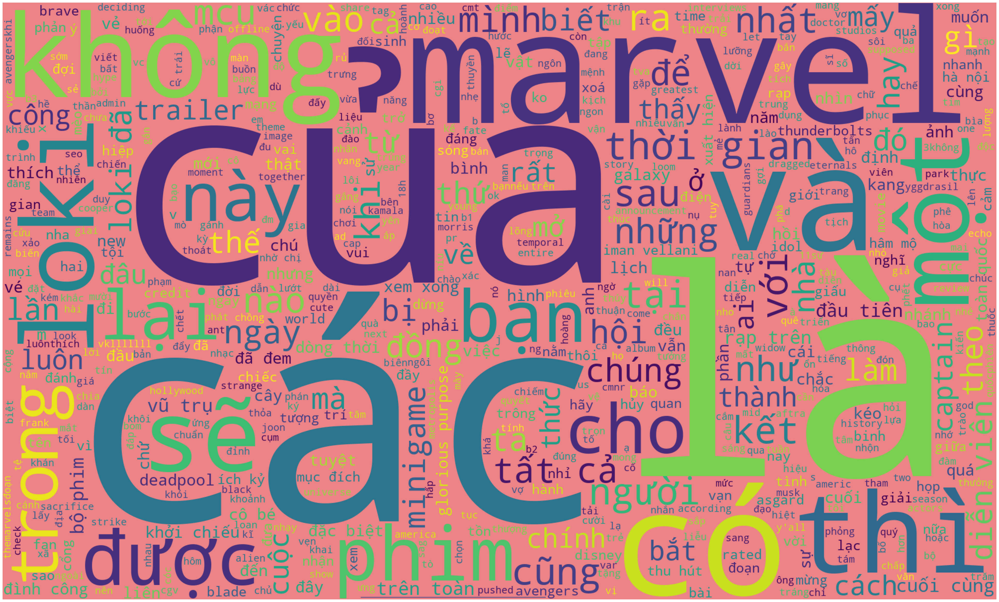

In [34]:
from wordcloud import WordCloud, STOPWORDS

wordcloud = WordCloud(stopwords=STOPWORDS,
                          background_color='#eb8387', 
                      max_words=10000,
                      width=2000, height=1200
                         ).generate(text)
plt.figure(figsize=(50,30))
plt.clf()
plt.imshow(wordcloud)
plt.axis('off')
plt.show()


### Tương tác

#### Trung bình lượt like, haha, wow, ... share, comment

In [35]:
average_values = df[['like', 'love', 'haha', 'sad', 'wow', 'care', 'angry', 'shares']].mean().round(2)
average_values

like      2477.50
love       222.88
haha       873.88
sad         63.05
wow         11.05
care        11.74
angry        1.31
shares      36.03
dtype: float64

#### Biểu đồ cột thể hiện trung bình lượt thả các biểu tượng cảm xúc, comment, shares

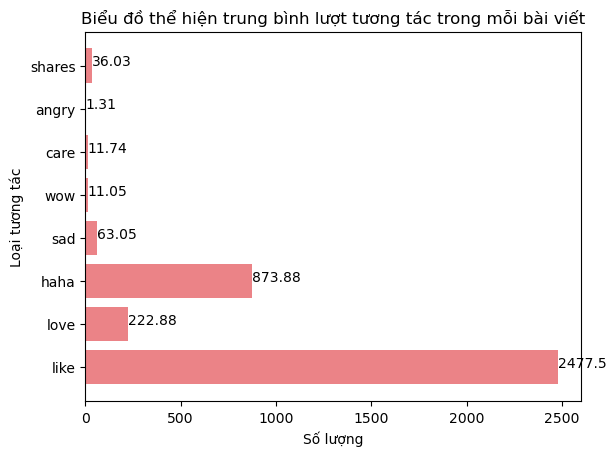

In [36]:
plt.barh(average_values.index, average_values.values, color='#eb8387')

for index, value in enumerate(average_values):
    plt.text(value, index, str(value))

plt.xlabel('Số lượng')
plt.ylabel('Loại tương tác')
plt.title('Biểu đồ thể hiện trung bình lượt tương tác trong mỗi bài viết')

plt.show()


#### Tỉ lệ phần trăm các emotions (20/10/2023 - 25/10/2023)

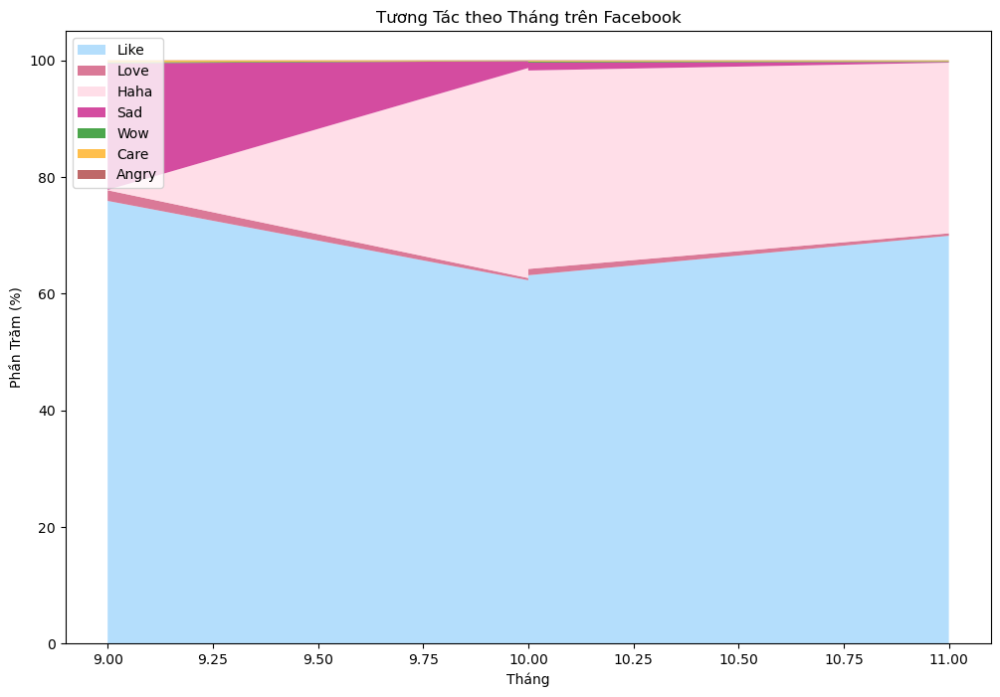

In [37]:
df['like_percentage'] = df['like'] / df['reaction_count'] * 100
df['love_percentage'] = df['love'] / df['reaction_count'] * 100
df['haha_percentage'] = df['haha'] / df['reaction_count'] * 100
df['sad_percentage'] = df['sad'] / df['reaction_count'] * 100
df['wow_percentage'] = df['wow'] / df['reaction_count'] * 100
df['care_percentage'] = df['care'] / df['reaction_count'] * 100
df['angry_percentage'] = df['angry'] / df['reaction_count'] * 100

plt.figure(figsize=(12, 8))

plt.stackplot(df['month'], df['like_percentage'], df['love_percentage'], df['haha_percentage'],
              df['sad_percentage'], df['wow_percentage'], df['care_percentage'], df['angry_percentage'],
              labels=['Like', 'Love', 'Haha', 'Sad', 'Wow', 'Care', 'Angry'],
              colors=['#95d0fc', '#cb416b', '#ffd1df', '#c20078', 'green', 'orange', 'brown'], alpha=0.7)

plt.xlabel('Tháng')
plt.ylabel('Phần Trăm (%)')
plt.title('Tương Tác theo Tháng trên Facebook')
plt.legend(loc='upper left')
plt.show()

#### Tỉ lệ giữa trung bình reaction_count giữa các tháng

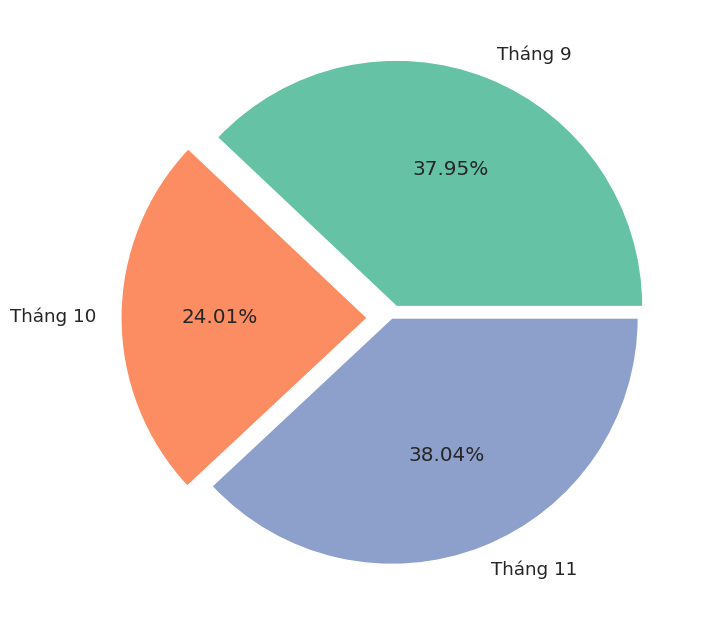

In [38]:
sns.set(font_scale = 1.2)
plt.figure(figsize=(8,8))

plt.pie(
    x=[average_reaction_count_by_month[9],average_reaction_count_by_month[10], average_reaction_count_by_month[11]],
    labels=['Tháng 9', 'Tháng 10', 'Tháng 11'],
    autopct='%1.2f%%',
    colors=sns.color_palette('Set2'),
    explode=[0.05, 0.1, 0]
)
plt.show()

#### Phương sai giữa các biểu tượng cảm xúc

In [39]:
emotions = ['like', 'love', 'haha', 'sad', 'wow', 'care', 'angry']
emotions_data = df[emotions]

variance_data = emotions_data.var()

print(variance_data)

like     4.513623e+06
love     2.137592e+05
haha     2.601010e+06
sad      6.188533e+04
wow      5.842997e+02
care     2.633185e+02
angry    1.249268e+00
dtype: float64


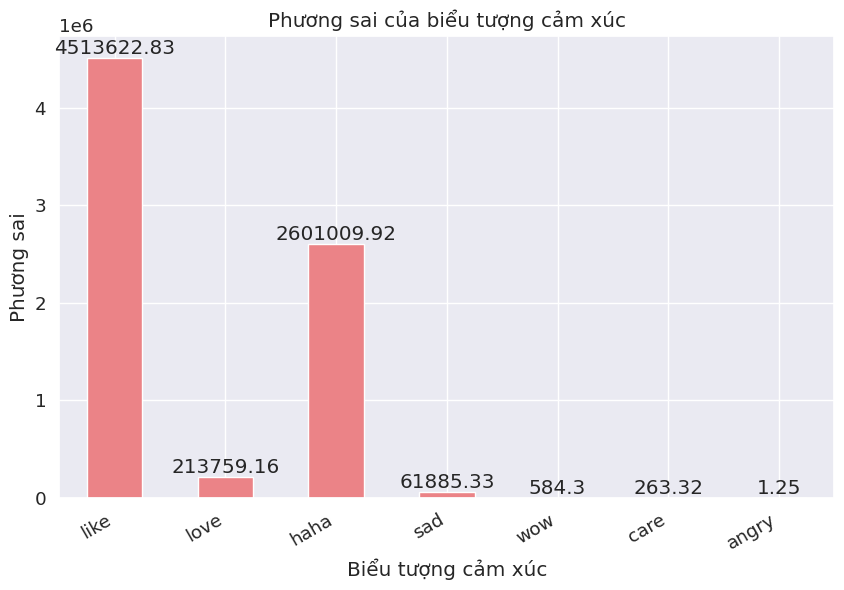

In [40]:
plt.figure(figsize=(10, 6))

# Vẽ biểu đồ cột
variance_data.plot(kind='bar', color='#eb8387')

# Thêm chú thích giá trị lên trên từng cột
for i, value in enumerate(variance_data):
    plt.text(i, value + 0.01, str(round(value, 2)), ha='center', va='bottom')

plt.title('Phương sai của biểu tượng cảm xúc')
plt.xlabel('Biểu tượng cảm xúc')
plt.ylabel('Phương sai')
plt.xticks(rotation=30, ha='right')
plt.show()


#### Vẽ biểu đồ thể hiện sự thay đổi lượng tương tác theo thời gian

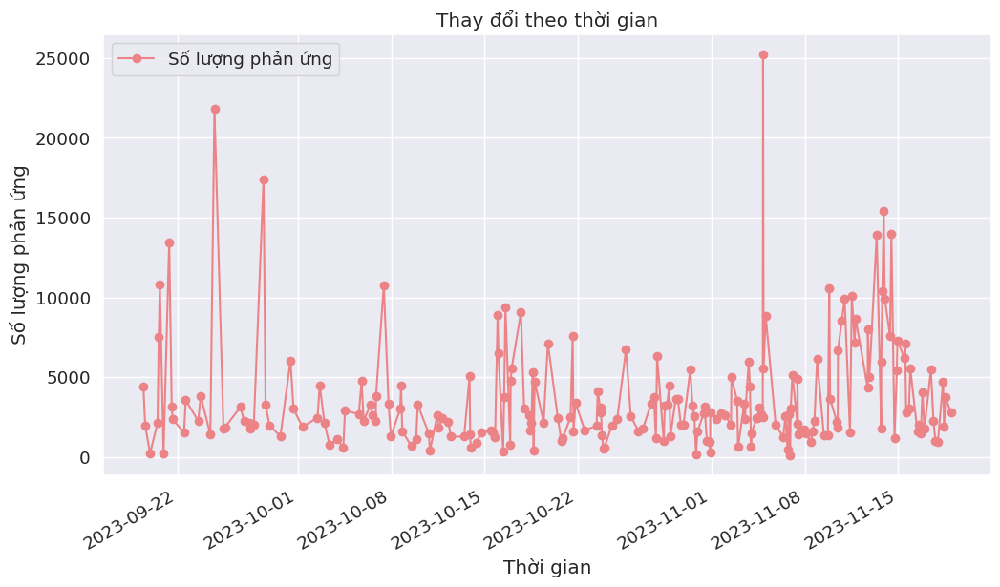

In [41]:
df['time'] = pd.to_datetime(df['time'])

# Sắp xếp DataFrame theo cột 'time'
df = df.sort_values(by='time')

plt.figure(figsize=(12, 6))
plt.plot(df['time'], df['reaction_count'], color='#eb8387', label='Số lượng phản ứng', marker='o')
plt.title('Thay đổi theo thời gian')
plt.xlabel('Thời gian')
plt.ylabel('Số lượng phản ứng')
plt.xticks(rotation=30, ha='right')
plt.legend()
plt.show()

#### Thay đổi của các biểu tượng cảm xúc theo thời gian

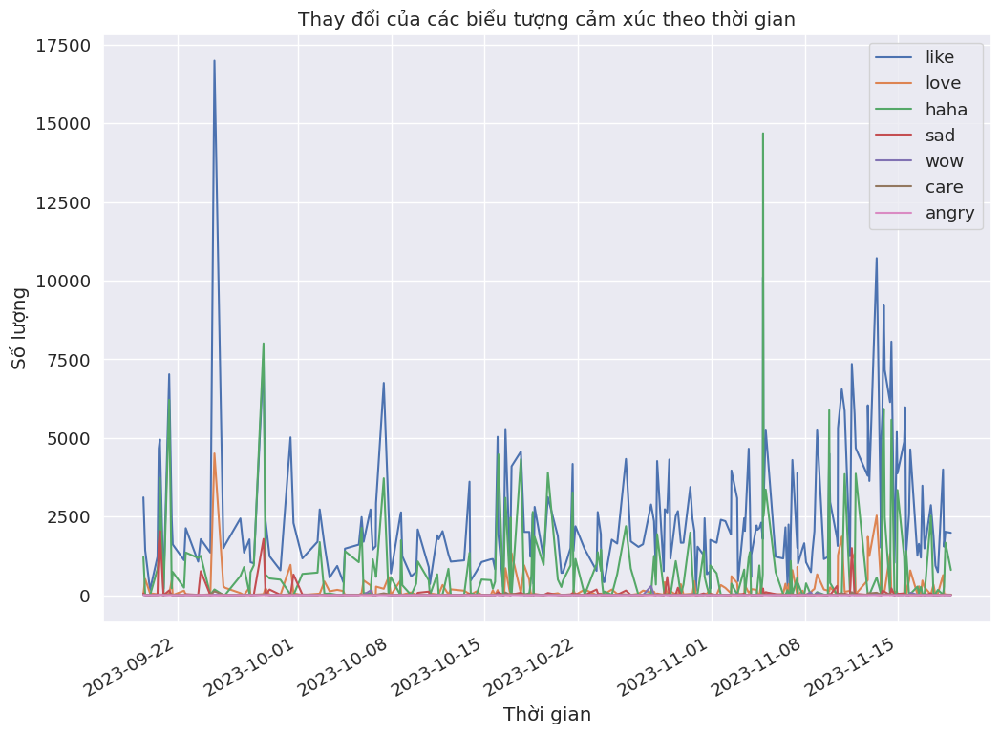

In [42]:
plt.figure(figsize=(12, 8))
emotions = ['like', 'love', 'haha', 'sad', 'wow', 'care', 'angry']

for emotion in emotions:
    plt.plot(df['time'], df[emotion], label=emotion)

plt.title('Thay đổi của các biểu tượng cảm xúc theo thời gian')
plt.xlabel('Thời gian')
plt.ylabel('Số lượng')
plt.xticks(rotation=30, ha='right')
plt.legend()
plt.show()

#### Biểu đồ tương quan giữa lượt like và lượt chia sẻ 

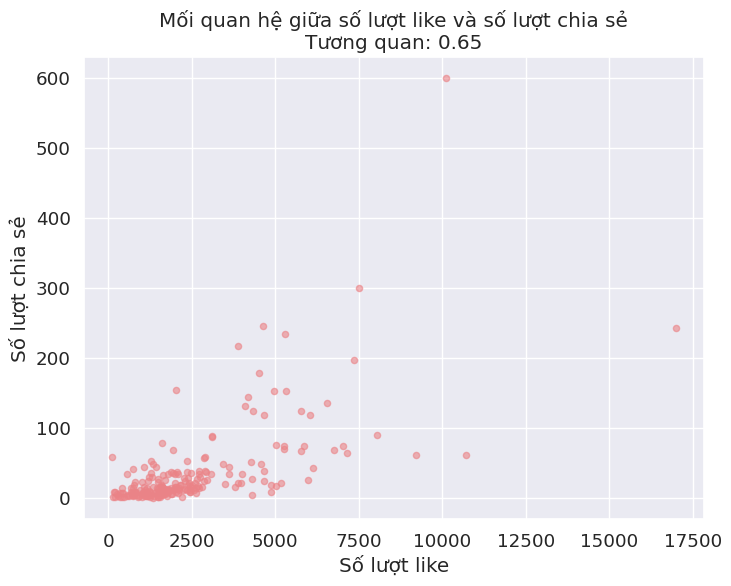

In [43]:
correlation_likes_shares = df['like'].corr(df['shares'])

plt.figure(figsize=(8, 6))
plt.scatter(df['like'], df['shares'], color='#eb8387', alpha=0.6, s=20)
plt.title(f'Mối quan hệ giữa số lượt like và số lượt chia sẻ\nTương quan: {correlation_likes_shares:.2f}')
plt.xlabel('Số lượt like')
plt.ylabel('Số lượt chia sẻ')
plt.show()

#### Biểu đồ thể hiện sự thay đổi số lượt phản ứng (19/09/2023 - 30/09/2023)

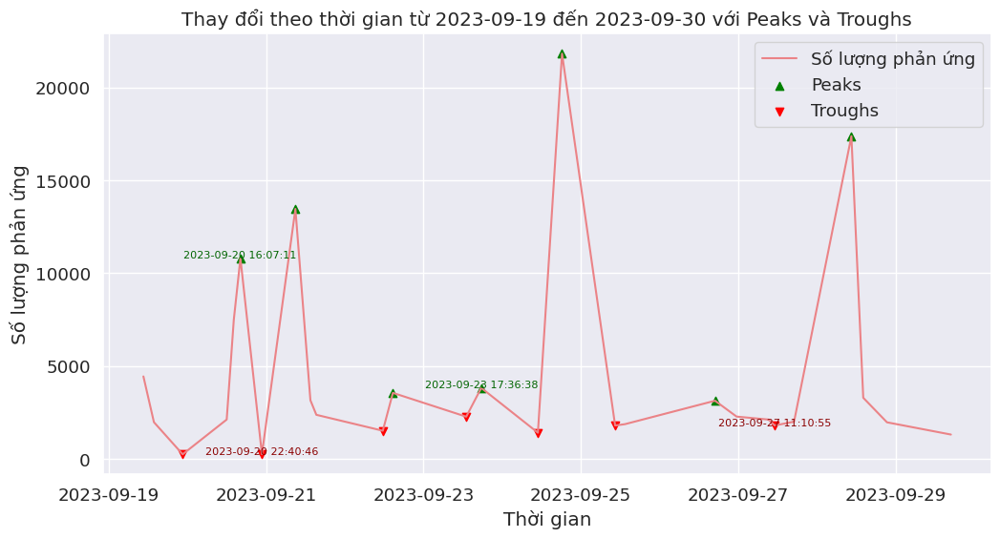

In [44]:
# Filter data for the desired date range
start_date = '2023-09-19'
end_date = '2023-09-30'
df_filtered = df[(df['time'] >= start_date) & (df['time'] <= end_date)]

# Get the Peaks and Troughs for the filtered data
data = df_filtered['reaction_count'].values
doublediff = np.diff(np.sign(np.diff(data)))
peak_locations = np.where(doublediff == -2)[0] + 1

doublediff2 = np.diff(np.sign(np.diff(-1 * data)))
trough_locations = np.where(doublediff2 == -2)[0] + 1

# Draw Plot
plt.figure(figsize=(12, 6))
plt.plot(df_filtered['time'], df_filtered['reaction_count'], label='Số lượng phản ứng', color='#eb8387')
plt.scatter(df_filtered['time'].iloc[peak_locations], df_filtered['reaction_count'].iloc[peak_locations], marker='^', color='green', label='Peaks')
plt.scatter(df_filtered['time'].iloc[trough_locations], df_filtered['reaction_count'].iloc[trough_locations], marker='v', color='red', label='Troughs')

# Annotate
for t, p in zip(trough_locations[1::5], peak_locations[::3]):
    plt.text(df_filtered['time'].iloc[p], df_filtered['reaction_count'].iloc[p] + 15, str(df_filtered['time'].iloc[p]), horizontalalignment='center', color='darkgreen', fontsize=8)
    plt.text(df_filtered['time'].iloc[t], df_filtered['reaction_count'].iloc[t] - 35, str(df_filtered['time'].iloc[t]), horizontalalignment='center', color='darkred', fontsize=8)

# Decoration
plt.title(f'Thay đổi theo thời gian từ {start_date} đến {end_date} với Peaks và Troughs')
plt.xlabel('Thời gian')
plt.ylabel('Số lượng phản ứng')
plt.legend()
plt.show()


#### Biểu đồ tương quan giữa reaction count và comment

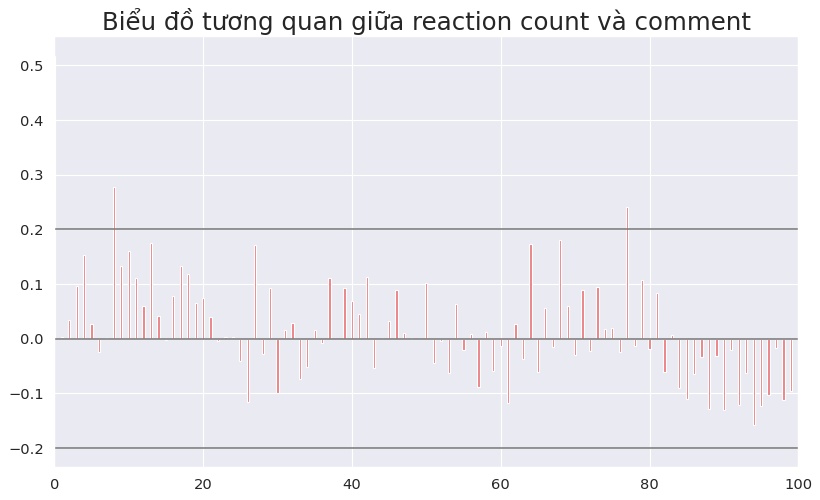

In [45]:
from statsmodels.tsa import stattools

x = df['reaction_count']
y = df['comment']

ccs = stattools.ccf(x, y)[:100]
nlags = len(ccs)

conf_level = 2 / np.sqrt(nlags)

plt.figure(figsize=(12, 7), dpi=80)

plt.hlines(0, xmin=0, xmax=100, color='gray')  # 0 axis
plt.hlines(conf_level, xmin=0, xmax=100, color='gray')
plt.hlines(-conf_level, xmin=0, xmax=100, color='gray')

plt.bar(x=np.arange(len(ccs)), height=ccs, width=0.3, color='#eb8387')

plt.title('Biểu đồ tương quan giữa reaction count và comment', fontsize=22)
plt.xlim(0, len(ccs))
plt.show()

#### Sự tương quan giữa tháng và các phản ứng

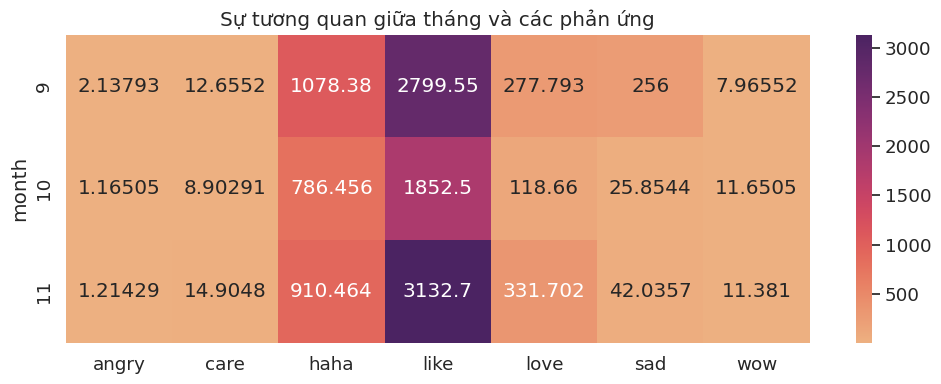

In [46]:
df['month'] = pd.to_numeric(df['month'], errors='coerce')

heatmap_data = df.pivot_table(index='month', values=['like', 'love', 'haha', 'sad', 'wow', 'care', 'angry'])

plt.figure(figsize=(12, 4))
sns.heatmap(heatmap_data, annot=True, cmap='flare', fmt='g')
plt.title('Sự tương quan giữa tháng và các phản ứng')
plt.show()

#### Sự tương quan giữa các biểu tượng cảm xúc, comment, share

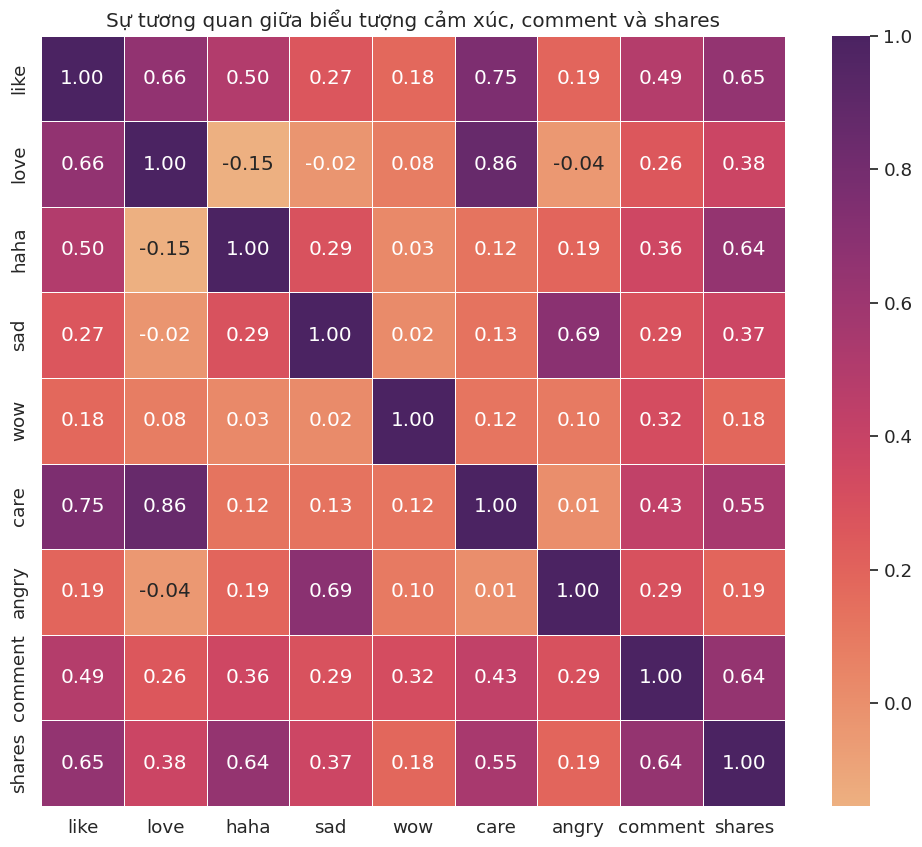

In [47]:
# Chọn các cột cần để tạo correllogram
selected_columns = ['like', 'love', 'haha', 'sad', 'wow', 'care', 'angry', 'comment', 'shares']

# Tạo một DataFrame con chứa chỉ các cột đã chọn
correlation_data = df[selected_columns]

# Tính ma trận tương quan
correlation_matrix = correlation_data.corr()

# Vẽ correllogram bằng Seaborn
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='flare', fmt='.2f', linewidths=.5)
plt.title('Sự tương quan giữa biểu tượng cảm xúc, comment và shares')
plt.show()

#### Biểu đồ thể hiện sự thay đổi tổng số bài viết của các ngày trong tuần

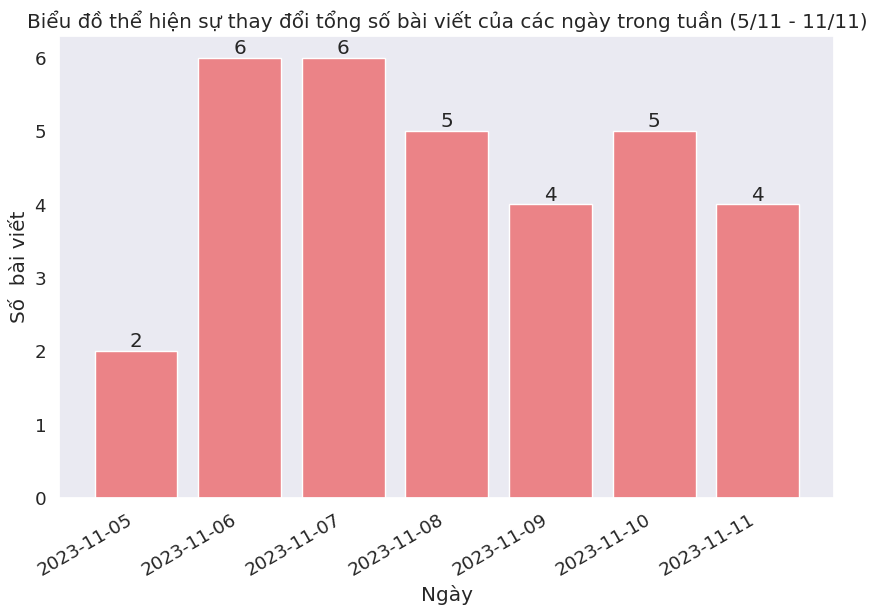

In [48]:
df['date'] = pd.to_datetime(df['date'])

start_date = pd.to_datetime('2023-11-05')
end_date = pd.to_datetime('2023-11-11')
filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

daily_posts = filtered_df.groupby('date').size().reset_index(name='post_count')

plt.figure(figsize=(10, 6))
bars = plt.bar(daily_posts['date'], daily_posts['post_count'], color='#eb8387')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.title('Biểu đồ thể hiện sự thay đổi tổng số bài viết của các ngày trong tuần (5/11 - 11/11)')
plt.xlabel('Ngày')
plt.ylabel('Số  bài viết')
plt.xticks(rotation=30, ha='right')
plt.grid(False)
plt.show()

#### Biểu đồ thể hiện sự thay đổi tổng số reaction_count của các ngày trong tuần (5/11 - 11/11)

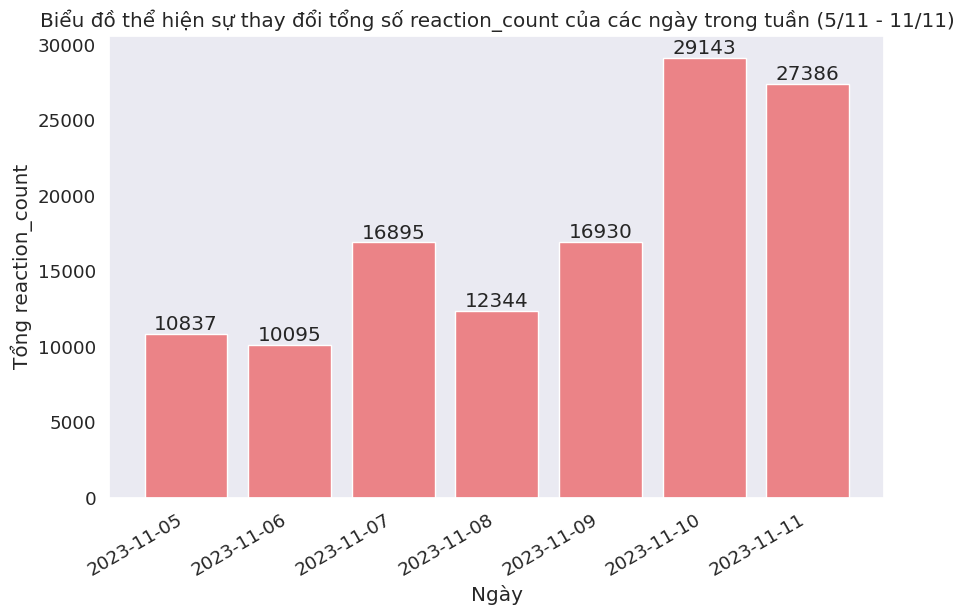

In [49]:

df['date'] = pd.to_datetime(df['date'])

start_date = pd.to_datetime('2023-11-05')
end_date = pd.to_datetime('2023-11-11')
filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

daily_reaction_count = filtered_df.groupby('date')['reaction_count'].sum().reset_index()

plt.figure(figsize=(10, 6))
bars = plt.bar(daily_reaction_count['date'], daily_reaction_count['reaction_count'], color='#eb8387')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.title('Biểu đồ thể hiện sự thay đổi tổng số reaction_count của các ngày trong tuần (5/11 - 11/11)')
plt.xlabel('Ngày')
plt.ylabel('Tổng reaction_count')
plt.grid(False)
plt.xticks(rotation=30, ha='right')
plt.show()


#### Biểu đồ thể hiện sự thay đổi tổng số comment và shares của các ngày trong tuần (5/11 - 11/11)

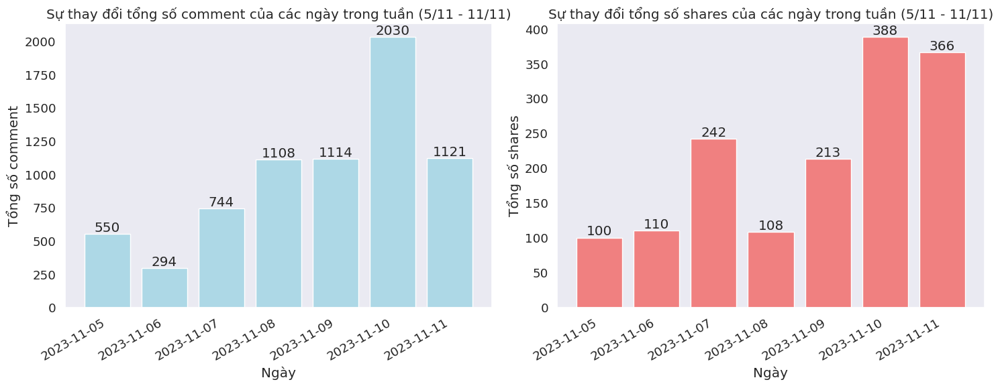

In [50]:
# Chuyển cột 'date' sang định dạng datetime nếu chưa phải
df['date'] = pd.to_datetime(df['date'])

# Lọc dữ liệu từ 5/11 đến 11/11/2023
start_date = pd.to_datetime('2023-11-05')
end_date = pd.to_datetime('2023-11-11')
filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]

# Nhóm theo ngày và tính tổng comment và shares trong mỗi ngày
daily_comment_count = filtered_df.groupby('date')['comment'].sum().reset_index()
daily_shares_count = filtered_df.groupby('date')['shares'].sum().reset_index()

# Vẽ biểu đồ cột cho comment
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
bars_comment = plt.bar(daily_comment_count['date'], daily_comment_count['comment'], color='lightblue')

# Thêm chú thích giá trị lên các cột
for bar in bars_comment:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.title('Sự thay đổi tổng số comment của các ngày trong tuần (5/11 - 11/11)')
plt.xlabel('Ngày')
plt.ylabel('Tổng số comment')
plt.xticks(rotation=30, ha='right')
plt.grid(False)

# Vẽ biểu đồ cột cho shares
plt.subplot(1, 2, 2)
bars_shares = plt.bar(daily_shares_count['date'], daily_shares_count['shares'], color='lightcoral')

# Thêm chú thích giá trị lên các cột
for bar in bars_shares:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

plt.title('Sự thay đổi tổng số shares của các ngày trong tuần (5/11 - 11/11)')
plt.xlabel('Ngày')
plt.ylabel('Tổng số shares')
plt.grid(False)
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()


#### Phân tích phân phối cảm xúc bằng biểu đồ box plot

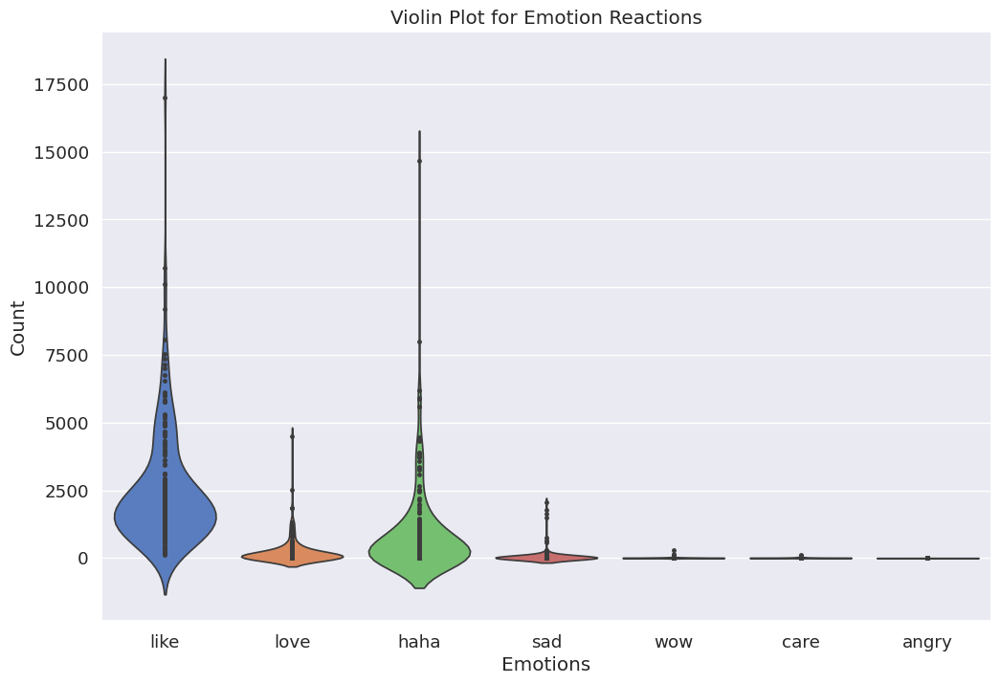

In [51]:
emotions = ['like', 'love', 'haha', 'sad', 'wow', 'care', 'angry']

# Tạo DataFrame mới chỉ chứa các cột cần thiết
df_emotions = df[emotions]

# Vẽ violin plot
plt.figure(figsize=(12, 8))
sns.violinplot(data=df_emotions, palette="muted", inner="points")
plt.title('Violin Plot for Emotion Reactions')
plt.xlabel('Emotions')
plt.ylabel('Count')
plt.show()


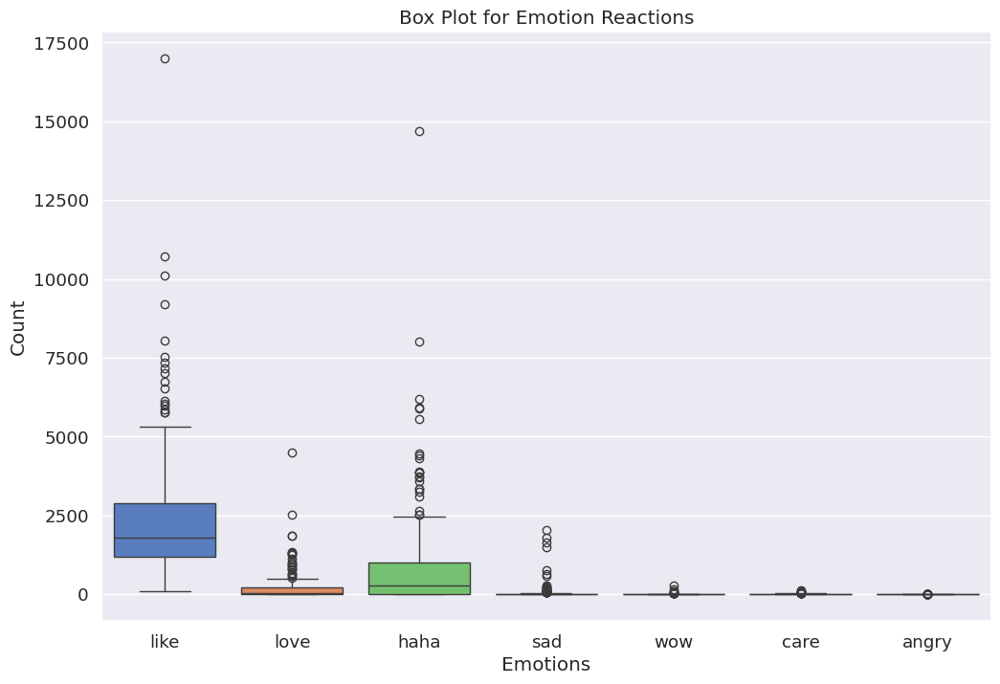

In [52]:
emotions = ['like', 'love', 'haha', 'sad', 'wow', 'care', 'angry']

df_emotions = df[emotions]

# Vẽ box plot
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_emotions, palette="muted")
plt.title('Box Plot for Emotion Reactions')
plt.xlabel('Emotions')
plt.ylabel('Count')
plt.show()


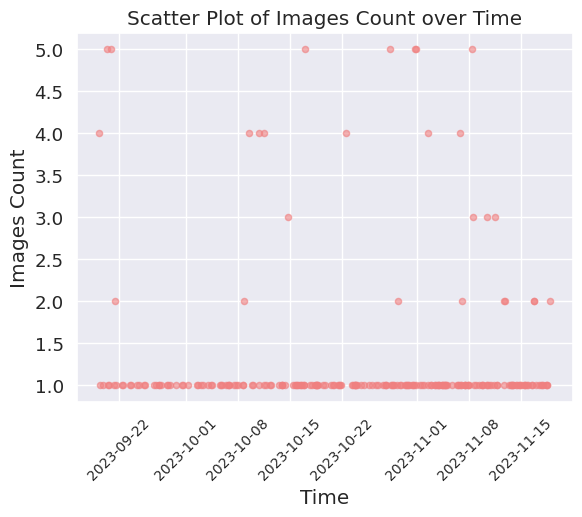

In [53]:
# Vẽ biểu đồ scatter
plt.scatter(df['time'], df['images_count'], color='lightcoral', alpha=0.6, s=20)

# Đặt tên trục và tiêu đề biểu đồ
plt.xlabel('Time')
plt.ylabel('Images Count')
plt.xticks(rotation=45, fontsize=10)
plt.title('Scatter Plot of Images Count over Time')

plt.show()


#### Phần trăm biểu tượng cảm xúc trong các post

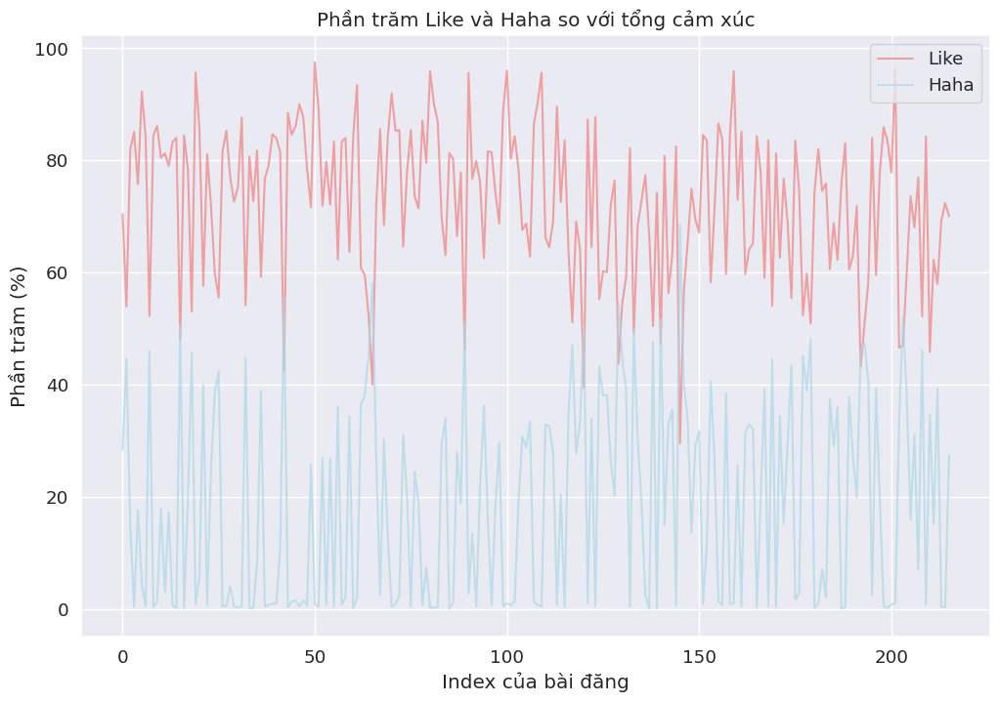

In [54]:
# Tính tổng lượng cảm xúc
df['total_reactions'] = df['like'] + df['love'] + df['haha'] + df['sad'] + df['wow'] + df['care'] + df['angry']

# Tính phần trăm 'like' và 'haha' so với tổng lượng cảm xúc
df['like_percentage'] = (df['like'] / df['total_reactions']) * 100
df['haha_percentage'] = (df['haha'] / df['total_reactions']) * 100

# Vẽ biểu đồ
plt.figure(figsize=(12, 8))

plt.plot(df.index, df['like_percentage'], label='Like', color='lightcoral', alpha=0.7)
plt.plot(df.index, df['haha_percentage'], label='Haha', color='lightblue', alpha=0.7)

plt.title('Phần trăm Like và Haha so với tổng cảm xúc')
plt.xlabel('Index của bài đăng')
plt.ylabel('Phần trăm (%)')
plt.legend()
plt.show()

#### Biểu đồ tự tương quan và tự tương quan một phần của biểu tượng like

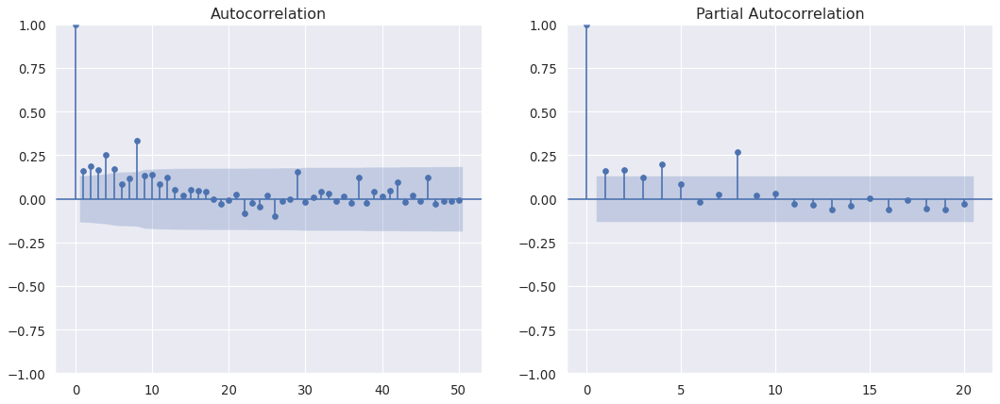

In [55]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), dpi=80)
plot_acf(df.like.to_list(), ax=ax1, lags=50)
plot_pacf(df.like.to_list(), ax=ax2, lags=20)

ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

# font size of tick labels
ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

#### Biểu đồ tự tương quan và tự tương quan một phần của reaction_count

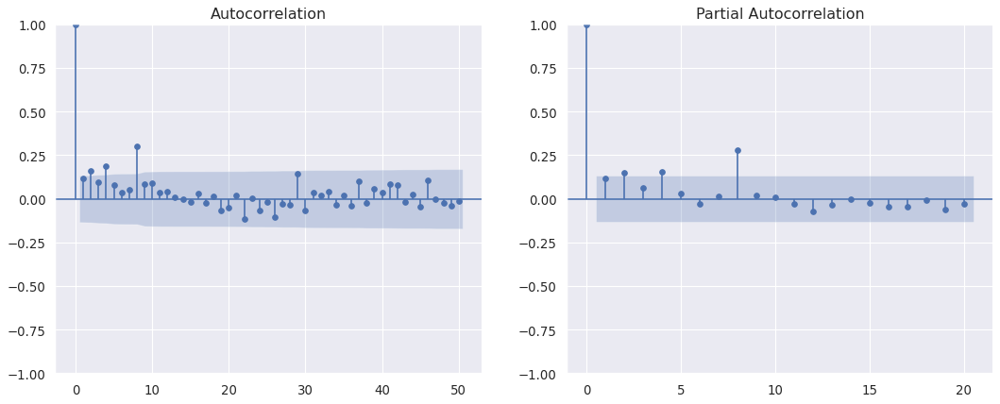

In [56]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), dpi=80)
plot_acf(df.reaction_count.to_list(), ax=ax1, lags=50)
plot_pacf(df.reaction_count.to_list(), ax=ax2, lags=20)

ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

# font size of tick labels
ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

#### Biểu đồ tự tương quan và tự tương quan một phần của comment

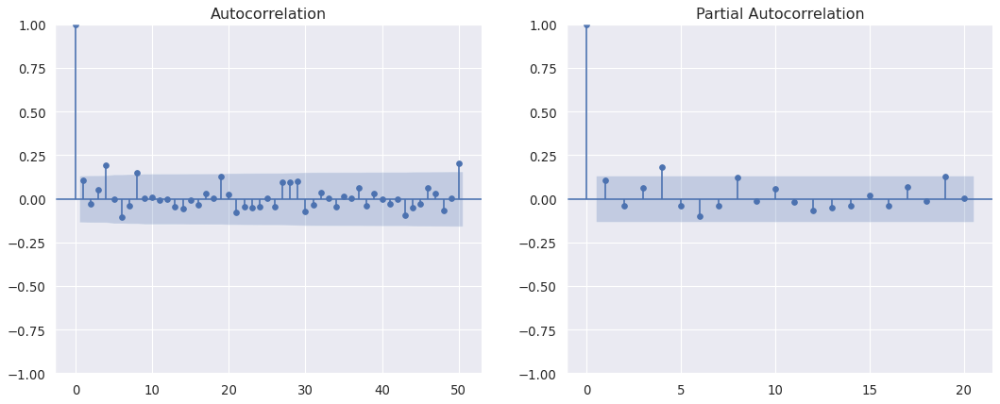

In [57]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), dpi=80)
plot_acf(df.comment.to_list(), ax=ax1, lags=50)
plot_pacf(df.comment.to_list(), ax=ax2, lags=20)

ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

# font size of tick labels
ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

#### Biểu đồ tự tương quan và tự tương quan một phần của shares

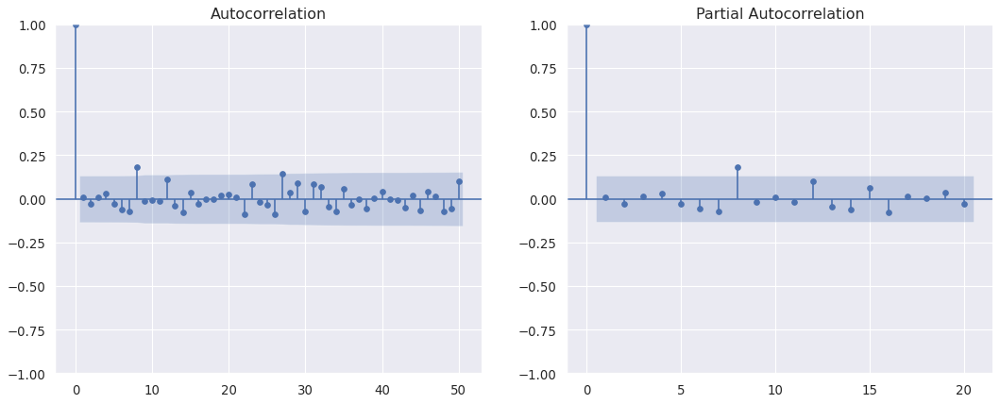

In [58]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), dpi=80)
plot_acf(df.shares.to_list(), ax=ax1, lags=50)
plot_pacf(df.shares.to_list(), ax=ax2, lags=20)

ax1.spines["top"].set_alpha(.3); ax2.spines["top"].set_alpha(.3)
ax1.spines["bottom"].set_alpha(.3); ax2.spines["bottom"].set_alpha(.3)
ax1.spines["right"].set_alpha(.3); ax2.spines["right"].set_alpha(.3)
ax1.spines["left"].set_alpha(.3); ax2.spines["left"].set_alpha(.3)

# font size of tick labels
ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

#### Trực quan hóa số post trong một ngày (19/09/2023 - 18/11/2023)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


<Figure size 1280x800 with 0 Axes>

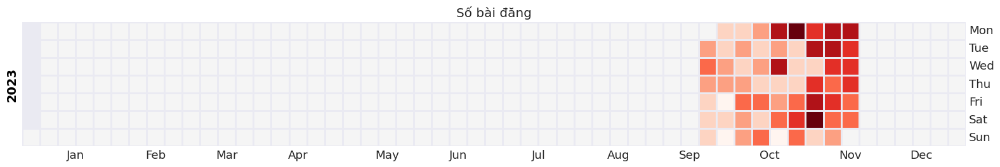

In [59]:

df['date'] = pd.to_datetime(df['date'])

posts_per_day_df = df.groupby('date').size().reset_index(name='post_count')

posts_per_day_df.set_index('date', inplace=True)

plt.figure(figsize=(16, 10), dpi=80)
calmap.calendarplot(posts_per_day_df['post_count'], fig_kws={'figsize':(16, 10)}, yearlabel_kws={'color':'black', 'fontsize':14}, subplot_kws={'title':"Số bài đăng"})
plt.show()

#### Trực quan hóa số reaction trong một ngày (19/09/2023 - 18/11/2023)

<Figure size 1280x800 with 0 Axes>

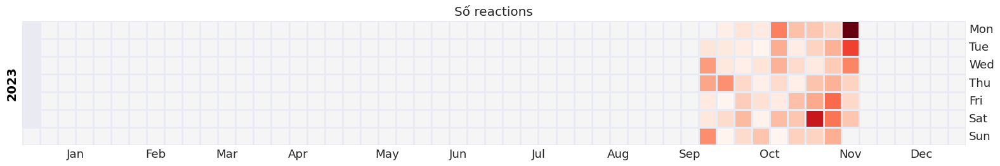

In [60]:
df['date'] = pd.to_datetime(df['date'])

reaction_count_per_day = df.groupby('date')['reaction_count'].sum().reset_index()

reaction_count_per_day.set_index('date', inplace=True)

plt.figure(figsize=(16, 10), dpi=80)
calmap.calendarplot(reaction_count_per_day['reaction_count'], fig_kws={'figsize':(16, 10)}, yearlabel_kws={'color':'black', 'fontsize':14}, subplot_kws={'title':"Số reactions"})
plt.show()

#### Trực quan hóa số images trong một ngày (19/09/2023 - 18/11/2023)

<Figure size 1280x800 with 0 Axes>

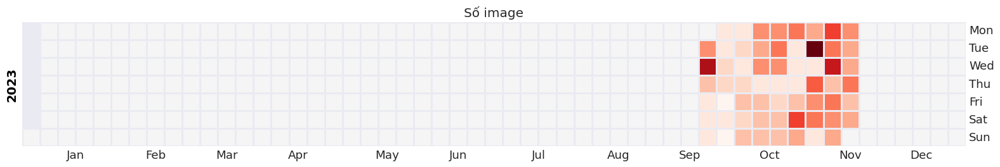

In [61]:
df['date'] = pd.to_datetime(df['date'])

images_count_per_day = df.groupby('date')['images_count'].sum().reset_index()

images_count_per_day.set_index('date', inplace=True)

plt.figure(figsize=(16, 10), dpi=80)
calmap.calendarplot(images_count_per_day['images_count'], fig_kws={'figsize':(16, 10)}, yearlabel_kws={'color':'black', 'fontsize':14}, subplot_kws={'title':"Số image"})
plt.show()

#### Trực quan hóa số comment trong một ngày (19/09/2023 - 18/11/2023)

<Figure size 1280x800 with 0 Axes>

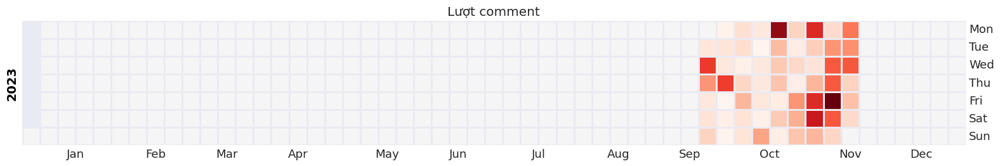

In [62]:
df['date'] = pd.to_datetime(df['date'])

comment_count_per_day = df.groupby('date')['comment'].sum().reset_index()

comment_count_per_day.set_index('date', inplace=True)

plt.figure(figsize=(16, 10), dpi=80)
calmap.calendarplot(comment_count_per_day['comment'], fig_kws={'figsize':(16, 10)}, yearlabel_kws={'color':'black', 'fontsize':14}, subplot_kws={'title':"Lượt comment"})
plt.show()

#### Trực quan hóa số shares trong một ngày (19/09/2023 - 18/11/2023)

<Figure size 1280x800 with 0 Axes>

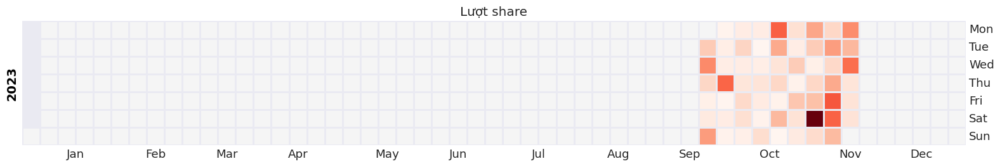

In [63]:
df['date'] = pd.to_datetime(df['date'])

shares_count_per_day = df.groupby('date')['shares'].sum().reset_index()

shares_count_per_day.set_index('date', inplace=True)

plt.figure(figsize=(16, 10), dpi=80)
calmap.calendarplot(shares_count_per_day['shares'], fig_kws={'figsize':(16, 10)}, yearlabel_kws={'color':'black', 'fontsize':14}, subplot_kws={'title':"Lượt share"})
plt.show()

### Dự đoán dựa vào dữ liệu đầu vào

#### Dự đoán lượng reactions dựa vào lượt like

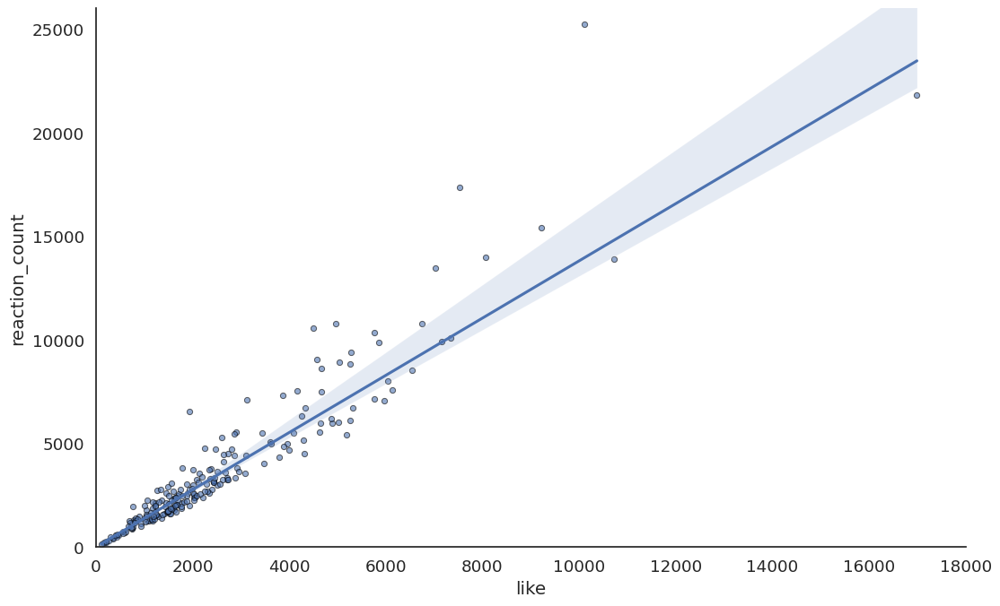

In [64]:
df_select = df[['like', 'reaction_count']]
sns.set_style('white')
gridobj = sns.lmplot(x='like', y='reaction_count', data=df_select,
                     height=7, aspect=1.6, robust=True, palette='tab10',
                     scatter_kws=dict(s=20, alpha=0.6, linewidths=0.7, edgecolors='black'))
gridobj.set(xlim=(0, 18000), ylim=(0, 26000))
plt.show()

#### Dự đoán lượng reactions dựa vào lượt haha

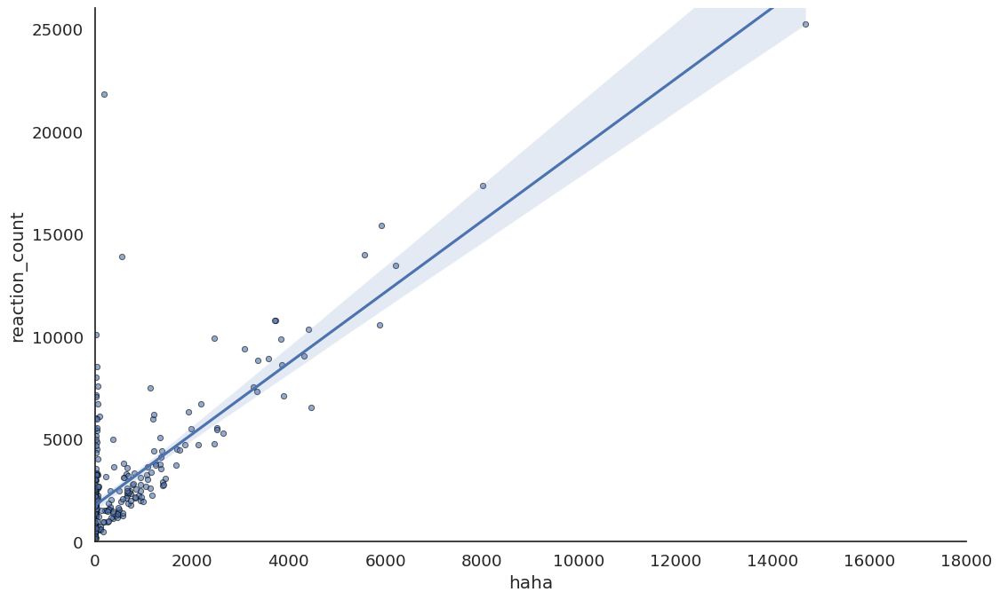

In [65]:
df_select = df[['haha', 'reaction_count']]
sns.set_style('white')
gridobj = sns.lmplot(x='haha', y='reaction_count', data=df_select,
                     height=7, aspect=1.6, robust=True, palette='tab10',
                     scatter_kws=dict(s=20, alpha=0.6, linewidths=0.7, edgecolors='black'))
gridobj.set(xlim=(0, 18000), ylim=(0, 26000))
plt.show()

#### Dự đoán lượng comment dựa vào lượng reaction

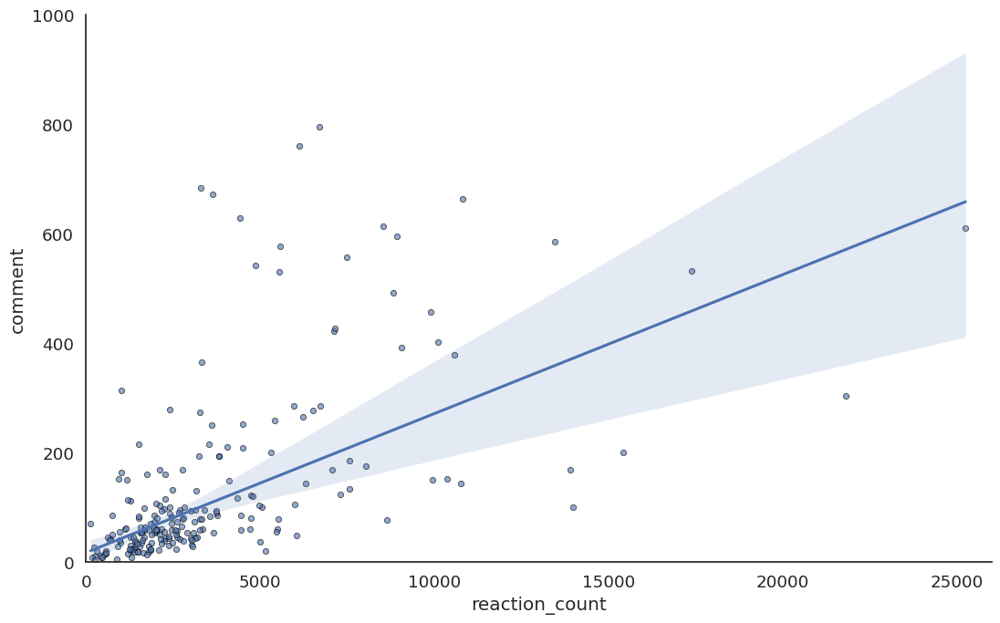

In [66]:
df_select = df[['comment', 'reaction_count']]
sns.set_style('white')
gridobj = sns.lmplot(x='reaction_count', y='comment', data=df_select,
                     height=7, aspect=1.6, robust=True, palette='tab10',
                     scatter_kws=dict(s=20, alpha=0.6, linewidths=0.7, edgecolors='black'))
gridobj.set(xlim=(0, 26000), ylim=(0, 1000))
plt.show()

#### Dự đoán lượng comment dựa vào lượng reaction

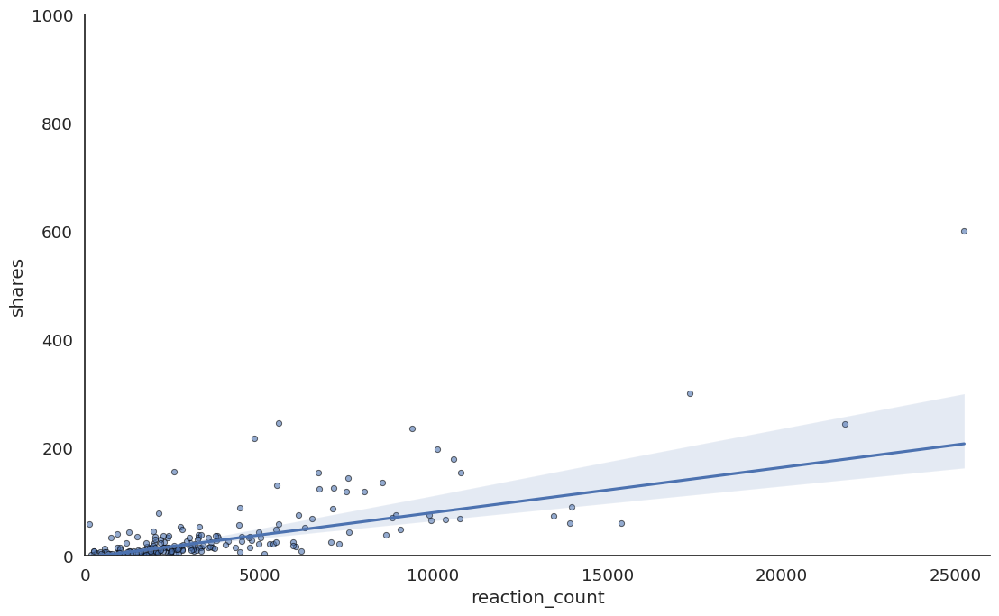

In [67]:
df_select = df[['shares', 'reaction_count']]
sns.set_style('white')
gridobj = sns.lmplot(x='reaction_count', y='shares', data=df_select,
                     height=7, aspect=1.6, robust=True, palette='tab10',
                     scatter_kws=dict(s=20, alpha=0.6, linewidths=0.7, edgecolors='black'))
gridobj.set(xlim=(0, 26000), ylim=(0, 1000))
plt.show()

#### Thời gian đăng bài lấy được nhiều reaction nhất

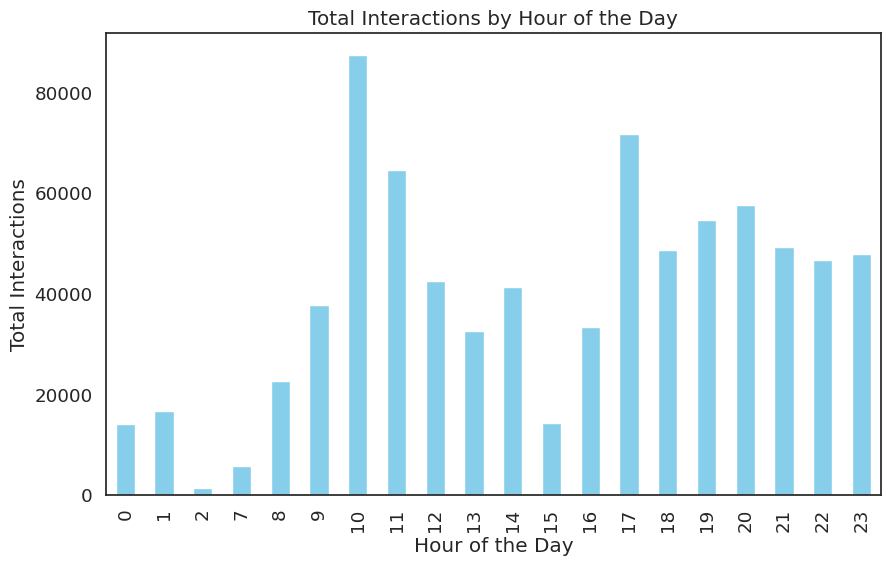

The best hour to post for maximum interactions is: 10


In [68]:
df['time'] = pd.to_datetime(df['time'])

df['hour'] = df['time'].dt.hour

hourly_interactions = df.groupby('hour')['reaction_count'].sum()

plt.figure(figsize=(10, 6))
hourly_interactions.plot(kind='bar', color='skyblue')
plt.title('Total Interactions by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Interactions')
plt.show()

best_hour = hourly_interactions.idxmax()
print(f"The best hour to post for maximum interactions is: {best_hour}")


#### Thời gian đăng bài lấy được nhiều comment nhất

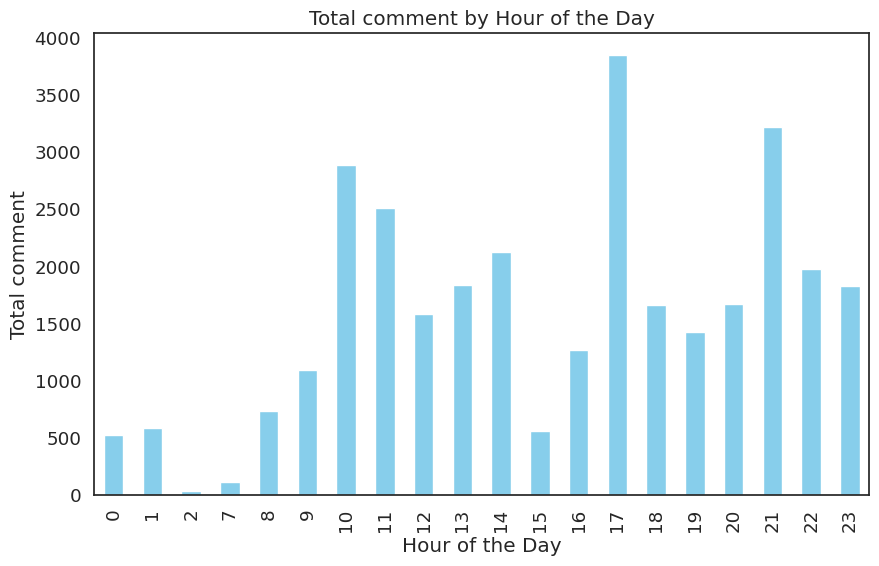

The best hour to post for maximum comment is: 17


In [69]:
df['time'] = pd.to_datetime(df['time'])

df['hour'] = df['time'].dt.hour

hourly_interactions = df.groupby('hour')['comment'].sum()

plt.figure(figsize=(10, 6))
hourly_interactions.plot(kind='bar', color='skyblue')
plt.title('Total comment by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Total comment')
plt.show()

best_hour = hourly_interactions.idxmax()
print(f"The best hour to post for maximum comment is: {best_hour}")


#### Thời gian đăng bài lấy được nhiều shares nhất

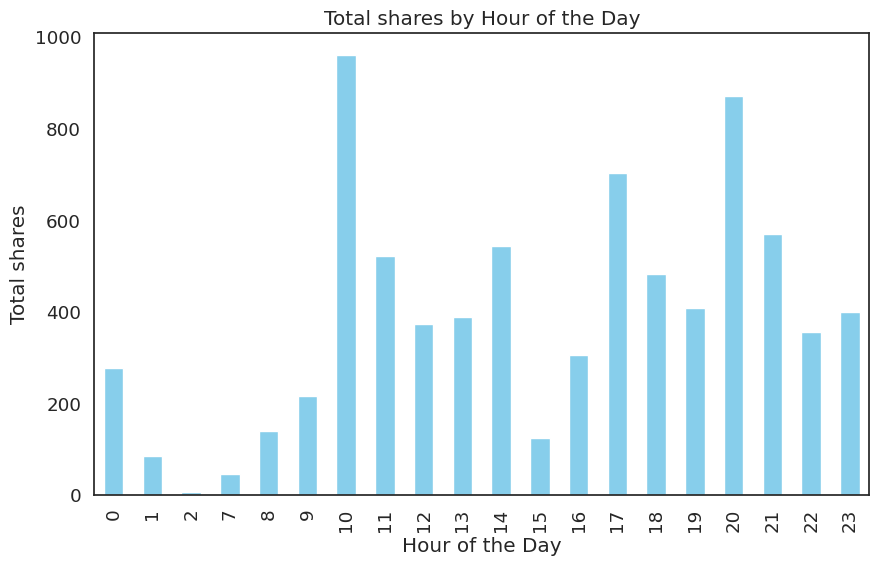

The best hour to post for maximum shares is: 10


In [70]:
df['time'] = pd.to_datetime(df['time'])

df['hour'] = df['time'].dt.hour

hourly_interactions = df.groupby('hour')['shares'].sum()

plt.figure(figsize=(10, 6))
hourly_interactions.plot(kind='bar', color='skyblue')
plt.title('Total shares by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Total shares')
plt.show()

best_hour = hourly_interactions.idxmax()
print(f"The best hour to post for maximum shares is: {best_hour}")


### Phân tích reactors

In [113]:
reactor_df = pd.read_csv('Data/least_emotional_post_reactors.csv')

#### Số người để ẩn giới tính

In [107]:
count_none_gender = (reactor_df['gender'].isna()).sum()
count_none_gender

68

#### Tỉ lệ nam nữ trong số người công khai giới tính

In [108]:
male_count = len(reactor_df[reactor_df['gender'] == 'male'])
female_count = len(reactor_df[reactor_df['gender'] == 'female'])

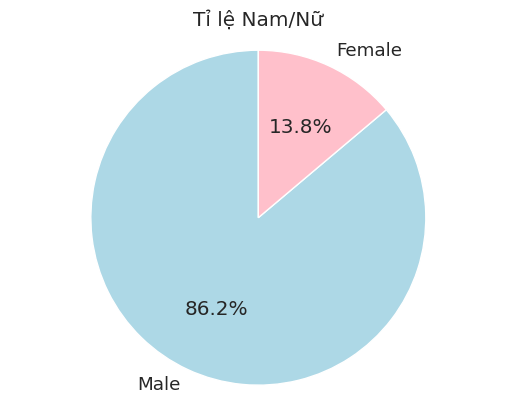

In [109]:
labels = ['Male', 'Female']
sizes = [male_count, female_count]
colors = ['lightblue', 'pink']

# Vẽ biểu đồ tròn
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
plt.axis('equal')  # Đảm bảo biểu đồ tròn có hình dạng tròn
plt.title('Tỉ lệ Nam/Nữ')

# Hiển thị biểu đồ
plt.show()


#### Số người để ẩn quê quán

In [112]:
count_none_hometown = reactor_df['hometown_id'].isna()
count_none_hometown

0       True
1      False
2      False
3       True
4       True
       ...  
128     True
129     True
130     True
131     True
132     True
Name: hometown_id, Length: 133, dtype: bool

#### Danh sách những người để public quê quán

In [114]:
reactor_public_hometown_df = reactor_df[reactor_df['hometown_id'].notna()]
reactor_public_hometown_df

,user_id,gender,hometown_id,hometown_name
1,100089689677144,male,1.109042e+14,Thanh Chuong
2,100085936672198,male,1.064987e+14,Thu Dau Mot
6,maybachs15,NaN,1.039346e+14,Hải Dương
8,viettrance.tn,NaN,1.039985e+14,Thái Nguyên
9,annguyen.hoang1204,NaN,1.063880e+13,Hanoi
10,owocycy,NaN,1.092522e+14,Yên Bái
16,kien.buihuu.1460,NaN,1.084588e+14,Ho Chi Minh City
30,2im.nkl,NaN,1.063880e+13,Hanoi
32,Nolggg,NaN,1.063880e+13,Hanoi
36,vu.hoanganh.334491,male,1.063880e+13,Hanoi


#### Địa phương được nhắc đến nhiều nhất

In [121]:
hometown_counts = reactor_public_hometown_df['hometown_name'].value_counts()
most_common_hometown = hometown_counts.idxmax()
count_most_common_hometown = hometown_counts.max()
print(f"Địa phương phổ biến nhất là {most_common_hometown} với {count_most_common_hometown} người.")

Địa phương phổ biến nhất là Hanoi với 10 người.
